In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt

import jax
import jax.numpy as jnp

from flax import linen as nn
import optax
from tqdm.auto import tqdm

from jax import jit

import tensorflow as tf
import tensorflow_datasets as tfds
from cone.utils.misc import pshape
from einops import rearrange
from cone.utils.plot import scatter_movie, imshow_movie
from cone.utils.misc import meanvmap, tracewrap
from jax import jacrev, jacfwd, vmap

2024-10-24 12:03:42.710559: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-24 12:03:42.774862: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-24 12:03:42.799572: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-24 12:03:44.314849: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
# Load the EMNIST dataset with (image, label) pairs
ds_train = tfds.load("emnist/balanced", split="train", as_supervised=True)
ds_test = tfds.load("emnist/balanced", split="test", as_supervised=True)


def preprocess_emnist(image, label):
    image = tf.image.rot90(image, k=3)
    image = tf.image.flip_left_right(image)
    image = tf.cast(image, tf.float32) / 255.0
    return image, label


batch_size = 512
# Preprocess the training dataset
ds_train = ds_train.map(preprocess_emnist, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.shuffle(10000)
ds_train = ds_train.batch(batch_size)
ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

# Preprocess the test dataset
ds_test = ds_test.map(preprocess_emnist, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.batch(batch_size)
ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

# Convert datasets to NumPy iterators for JAX
ds_train = tfds.as_numpy(ds_train)
ds_test = tfds.as_numpy(ds_test)

2024-10-24 12:03:48.943992: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2343] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [4]:
def get_loss_fn(vae, beta):
    def loss_fn(params, x, key):

        logits, mu, logvar = vae.apply(params, x, rngs={"latent": key})

        recon_loss = (
            optax.sigmoid_binary_cross_entropy(logits=logits, labels=x)
            .sum(axis=[1, 2, 3])
            .mean()
        )

        kl_loss = -0.5 * jnp.mean(
            jnp.sum(1 + logvar - (mu) ** 2 - jnp.exp(logvar), axis=-1)
        )

        # vars = jnp.ones_like(y)

        # kl_loss = kl_divergence_v(biases, vars, mu, logvar)

        total_loss = recon_loss + beta * kl_loss
        return total_loss, (recon_loss, kl_loss)

    return loss_fn

In [5]:
from cone.net.vae import VAE
from cone.utils.misc import count_params


latent_features = 32
encoder_features = [1, 64, 48, 32]
decoder_features = [32, 48, 64, 1]
kernel = 2
key = jax.random.PRNGKey(1)
vae = VAE(
    latent_features=latent_features,
    encoder_features=encoder_features,
    decoder_features=decoder_features,
    kernel_size=kernel,
    padding="SAME",
)


x_dummy = jnp.zeros((batch_size, 28, 28, 1))
key = jax.random.PRNGKey(0)
p_key, l_key, key = jax.random.split(key, num=3)
init_rng = {"params": p_key, "latent": l_key}

2024-10-24 12:03:49.812230: W external/xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.6.77. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [6]:
def get_samplers(vae, params, x):
    _, _, shape = vae.apply(params, x, method=vae.encode)

    @jit
    def encode(params, x, key):
        z = vae.apply(params, x, key, method=vae.encode_latent)
        return z

    @jit
    def decode(params, x):
        logits = vae.apply(params, x, shape, method=vae.decode)
        return nn.sigmoid(logits)

    return encode, decode

In [7]:
params_init = vae.init(init_rng, x_dummy)
encoder, decoder = get_samplers(vae, params_init, x_dummy)
print(count_params(params_init))

n_epochs = 30
# set up the optimizer
n_batches = len(ds_train)
n_steps = n_epochs * n_batches
learning_rate = optax.cosine_decay_schedule(1e-3, decay_steps=n_epochs * n_steps)
optimizer = optax.adam(learning_rate)
optimizer_state = optimizer.init(params_init)

beta = 0.01

loss_fn = get_loss_fn(vae, beta)


@jit
def train_step(params, x, optimizer_state, key):
    skey, key = jax.random.split(key)
    (loss, aux), grads = jax.value_and_grad(loss_fn, has_aux=True)(params, x, skey)
    updates, optimizer_state = optimizer.update(grads, optimizer_state)
    params = optax.apply_updates(params, updates)
    return params, optimizer_state, loss, aux, key


opt_params = params_init
# training loop
pbar = tqdm(total=n_batches)
for epoch in range(n_epochs):

    pbar.reset(total=n_batches)
    pbar.set_description(f"Epoch {epoch + 1}/{n_epochs}")

    for batch in ds_train:

        x, y = batch

        opt_params, optimizer_state, loss, aux, key = train_step(
            opt_params, x, optimizer_state, key
        )
        rc_loss, kl_loss = aux
        pbar.update(1)
        pbar.set_postfix(
            {
                "loss": f"{loss:.2E}",
                "rc_loss": f"{rc_loss:.2E}",
                "kl_loss": f"{kl_loss:.2E}",
            }
        )

2483814


  0%|          | 0/221 [00:00<?, ?it/s]

2024-10-24 12:03:55.059974: E tensorflow/core/util/util.cc:131] oneDNN supports DT_UINT8 only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


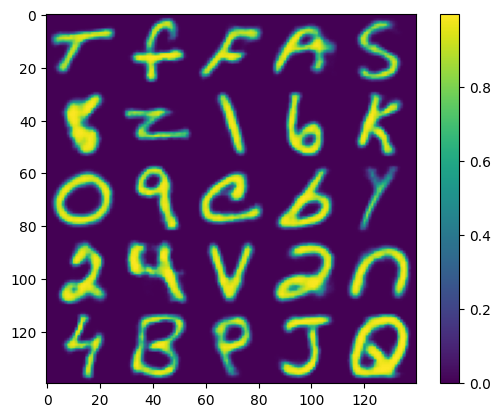

In [8]:
n_plt = 25
n_grid = int(np.sqrt(n_plt))
logits, mean, logvar = vae.apply(opt_params, x[:n_plt], rngs={"latent": key})
logits = rearrange(logits, "(n1 n2) h w c -> (n1 h) (n2 w) c", n1=n_grid, n2=n_grid)
recon = nn.sigmoid(logits)
plt.imshow(recon)
plt.colorbar()
plt.show()

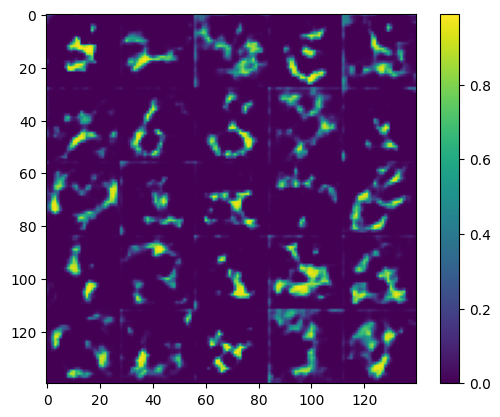

In [9]:
z = np.random.randn(n_plt, latent_features)
samples = decoder(opt_params, z)
samples = rearrange(samples, "(n1 n2) h w c -> (n1 h) (n2 w) c", n1=n_grid, n2=n_grid)
plt.imshow(samples)
plt.colorbar()
plt.show()

In [10]:
latents = []
labels = []
n_test_batches = 512
for i, (x, y) in enumerate(ds_train):
    key, skey = jax.random.split(key)
    z = encoder(opt_params, x, skey)
    latents.append(z)
    labels.append(y)
    if i > n_test_batches:
        break

latents = np.concatenate(latents)
labels = np.concatenate(labels)
latents.shape, labels.shape

((112800, 32), (112800,))

In [11]:
t_latents = []
classes = np.sort(np.unique(labels))
min_amt = np.inf
for c in classes:
    d = latents[labels == c]
    t_latents.append(d)
    min_amt = min(min_amt, len(d))

t_latents = np.asarray([tl[:min_amt] for tl in t_latents])
t_eval = jnp.asarray(classes) / classes.max()

In [12]:
from cone.integrate.sde import solve_sde_ic
def sde_langevin(score, ics, steps, epsilon, key):


    def langevin_chain(ic, key):
        def langevin_step(x_prev, key):
            noise = jax.random.normal(key=key, shape=x_prev.shape)
            x = x_prev + epsilon*score(0,x_prev) + jnp.sqrt(2*epsilon)*noise
           
            return x, x

        keys = jax.random.split(key, num=steps)
        _, xs = jax.lax.scan(langevin_step, ic, keys)
        xs = jnp.concatenate([ic.reshape(1,-1),xs], axis=0)
        return xs
        
    keys = jax.random.split(key, num=len(ics))
    sol = vmap(langevin_chain, (0,0))(ics, keys)
    sol = rearrange(sol, "N T D -> T N D")
    return sol



In [13]:
means = jnp.mean(t_latents, axis=1)
covs = vmap(jnp.cov)(jnp.transpose(t_latents, (0,2,1)))
covs_inv = vmap(jnp.linalg.inv)(covs)
covs_inv.shape, means.shape, t_latents.shape

2024-10-24 12:06:51.868905: W external/xla/xla/service/gpu/autotuning/gemm_fusion_autotuner.cc:1053] Compiling 22 configs for gemm_fusion_dot.19 on a single thread.


((47, 32, 32), (47, 32), (47, 2400, 32))

In [14]:
from functools import partial
ic = t_latents[0]
sol_score = []
taus = jnp.linspace(0,1,10)

epsilon = 1e-4
steps = 35000
datas = list(zip(covs_inv, means, t_latents))
for cov_inv, mu, true_ic in tqdm(datas):
    def score(t, x):
        return -cov_inv@(x-mu)

    # sde_langevin_fn = partial(sde_langevin, score)
    # sde_langevin_fn = jit(sde_langevin_fn)
    normal_ic = np.random.randn(*ic.shape)
    res = sde_langevin(score, normal_ic, steps, epsilon, key)
    ic = res[-1]
    sol_score.append(res[-1])

sol_score = np.asarray(sol_score)
# sol_score = np.concatenate(sol_score)


  0%|          | 0/47 [00:00<?, ?it/s]

2024-10-24 12:06:55.740437: W external/xla/xla/service/gpu/autotuning/gemm_fusion_autotuner.cc:1053] Compiling 23 configs for gemm_fusion_dot.0 on a single thread.


In [15]:
from cone.utils.misc import get_lims
d = 1

In [16]:
lims = get_lims(t_latents[:, :, d:d+2], as_dict=True)


scatter_movie([sol_score[:, :, d:d+2], t_latents[:, :, d:d+2]], alpha=0.2, **lims)

In [21]:
test_sol_decoded = []
sol_score_m = np.mean(sol_score, axis=1, keepdims=True)
for t in sol_score:
    de = decoder(opt_params, t)
    test_sol_decoded.append(de)
test_sol_decoded = np.asarray(test_sol_decoded)
test_sol_decoded = np.squeeze(test_sol_decoded)

In [23]:
from cone.utils.plot import imshow_movie

imshow_movie(test_sol_decoded[:, 10])